In [1]:
#Import Packages
from os.path import join
from pathlib import Path
import geopandas as gpd
import contextily as cx
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import xarray as xr
import rioxarray as rx
import rasterio as rs

In [2]:
FO = Path().absolute().parents[1]
FO

PosixPath('/Users/pbb62/Documents/Repositories/baltimore-data')

In [3]:
# geodataframe
balt_bg = gpd.read_file(join(FO, 'model_inputs','bg_baltimore.csv'), 
                        GEOM_POSSIBLE_NAMES="geometry",
                        KEEP_GEOM_COLUMNS="NO")

balt_bg = balt_bg.set_crs('epsg:3857')
#To Albers contiguous equal area
bg_visual = balt_bg.to_crs("ESRI:102003")
bg_area = balt_bg["geometry"].area
bg_visual["area"] = bg_area


In [14]:
#load surge area csvs
balt_base = pd.read_csv(join(FO, 'model_inputs', 'surge_area_baltimore_base.csv'))
balt_levee = pd.read_csv(join(FO, 'model_inputs', 'surge_area_baltimore_levee.csv'))

#Rejoin block group geometries
balt_base = bg_visual[["GISJOIN","geometry"]].merge(balt_base, on='GISJOIN')
base_gdf = gpd.GeoDataFrame(balt_base, geometry = balt_base.geometry, crs = bg_visual.crs)
base_gdf = base_gdf.to_crs('epsg:4269')

balt_levee = bg_visual[["GISJOIN","geometry"]].merge(balt_levee, on='GISJOIN')
levee_gdf = gpd.GeoDataFrame(balt_levee, geometry = balt_levee.geometry, crs = bg_visual.crs)
levee_gdf = levee_gdf.to_crs('epsg:4269')

In [15]:
#Select Block Groups located in Baltimore City
base_gdf = base_gdf.loc[base_gdf['GISJOIN'].str.startswith('G24051')]
base_gdf.replace(0, np.nan, inplace=True)

levee_gdf = levee_gdf.loc[levee_gdf['GISJOIN'].str.startswith('G24051')]
levee_gdf.replace(0, np.nan, inplace=True)

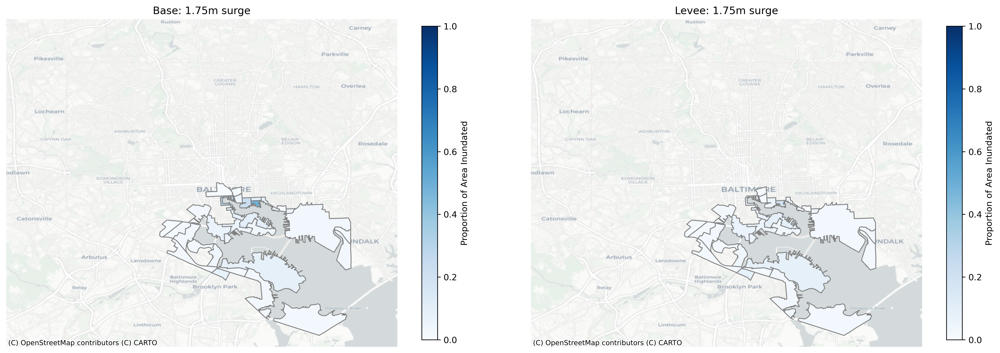

In [29]:
fig, axs = plt.subplots(1,2,figsize = (17,15), dpi=300)
fig.tight_layout()

xlim = ([-76.75, -76.5])
ylim = ([39.19, 39.4])

#xlim = ([1.63e6, 1.66e6])
#ylim = ([360000, 380500])

axs[0].set_axis_off()
axs[1].set_axis_off()


axs[0].set_xlim(xlim)
axs[0].set_ylim(ylim)

axs[1].set_xlim(xlim)
axs[1].set_ylim(ylim)



base_gdf.plot(column = '1.75',legend=True, vmin = 0, vmax = 1, cmap = 'Blues', edgecolor = 'grey', legend_kwds={"shrink":.35, "label":"Proportion of Area Inundated"}, ax = axs[0])
cx.add_basemap(axs[0], crs=base_gdf.crs, source=cx.providers.CartoDB.Positron)

levee_gdf.plot(column = '1.75',legend=True, vmin = 0, vmax = 1, cmap = 'Blues', edgecolor = 'grey', legend_kwds={"shrink":.35, "label":"Proportion of Area Inundated"}, ax = axs[1])
cx.add_basemap(axs[1], crs=levee_gdf.crs, source=cx.providers.CartoDB.Positron)


axs[0].set_title('Base: 1.75m surge')
axs[1].set_title('Levee: 1.75m surge')

plt.show()
fig.savefig(join(FO, 'figures','surge_area_175.jpg'), dpi=fig.dpi, bbox_inches='tight')

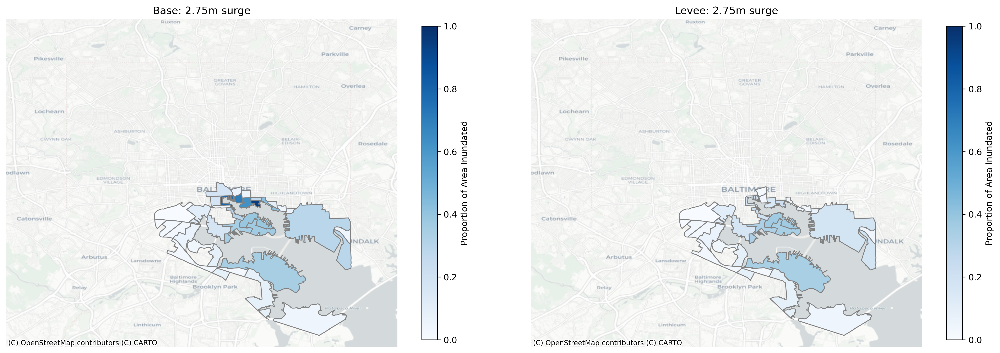

In [30]:
fig, axs = plt.subplots(1,2,figsize = (17,15), dpi=300)
fig.tight_layout()

xlim = ([-76.75, -76.5])
ylim = ([39.19, 39.4])

#xlim = ([1.63e6, 1.66e6])
#ylim = ([360000, 380500])

axs[0].set_axis_off()
axs[1].set_axis_off()


axs[0].set_xlim(xlim)
axs[0].set_ylim(ylim)

axs[1].set_xlim(xlim)
axs[1].set_ylim(ylim)



base_gdf.plot(column = '2.75',legend=True, vmin = 0, vmax = 1, cmap = 'Blues', edgecolor = 'grey', legend_kwds={"shrink":.35, "label":"Proportion of Area Inundated"}, ax = axs[0])
cx.add_basemap(axs[0], crs=base_gdf.crs, source=cx.providers.CartoDB.Positron)

levee_gdf.plot(column = '2.75',legend=True, vmin = 0, vmax = 1, cmap = 'Blues', edgecolor = 'grey', legend_kwds={"shrink":.35, "label":"Proportion of Area Inundated"}, ax = axs[1])
cx.add_basemap(axs[1], crs=levee_gdf.crs, source=cx.providers.CartoDB.Positron)


axs[0].set_title('Base: 2.75m surge')
axs[1].set_title('Levee: 2.75m surge')

plt.show()
fig.savefig(join(FO, 'figures','surge_area_275.jpg'), dpi=fig.dpi, bbox_inches='tight')

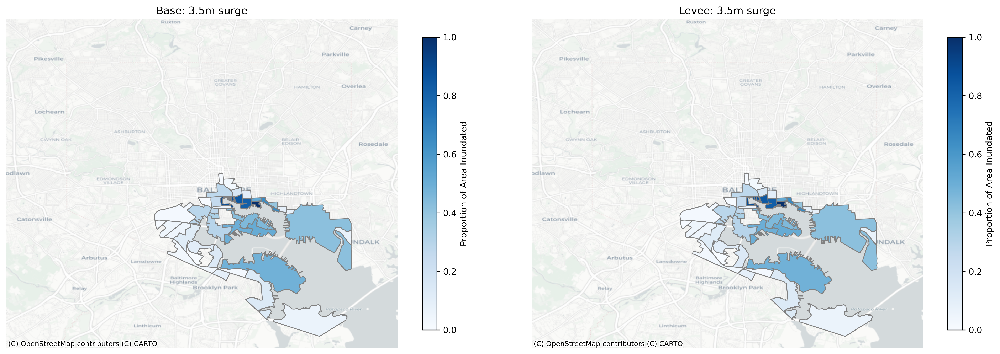

In [26]:
fig, axs = plt.subplots(1,2,figsize = (17,14), dpi=300)
fig.tight_layout() 

xlim = ([-76.75, -76.5])
ylim = ([39.19, 39.4])

#xlim = ([1.63e6, 1.66e6])
#ylim = ([360000, 380500])

axs[0].set_axis_off()
axs[1].set_axis_off()


axs[0].set_xlim(xlim)
axs[0].set_ylim(ylim)

axs[1].set_xlim(xlim)
axs[1].set_ylim(ylim)



base_gdf.plot(column = '3.5',legend=True, vmin = 0, vmax = 1, cmap = 'Blues', edgecolor = 'grey', legend_kwds={"shrink":.35, "label":"Proportion of Area Inundated"}, ax = axs[0])
cx.add_basemap(axs[0], crs=base_gdf.crs, source=cx.providers.CartoDB.Positron)

levee_gdf.plot(column = '3.5',legend=True, vmin = 0, vmax = 1, cmap = 'Blues', edgecolor = 'grey', legend_kwds={"shrink":.35, "label":"Proportion of Area Inundated"}, ax = axs[1])
cx.add_basemap(axs[1], crs=levee_gdf.crs, source=cx.providers.CartoDB.Positron)


axs[0].set_title('Base: 3.5m surge')
axs[1].set_title('Levee: 3.5m surge')

plt.show()
fig.savefig(join(FO, 'figures','surge_area_35.jpg'), dpi=fig.dpi, bbox_inches='tight')

<Axes: >

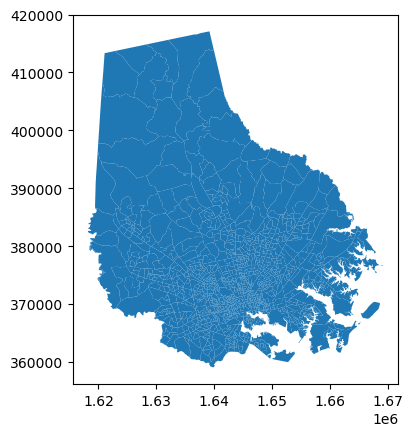

In [4]:
#visualize geodataframe
bg_visual.plot()

In [ ]:
### Visualize Surge Depths

In [7]:
#load surge csvs
balt_base = pd.read_csv('model_inputs/surge_baltimore_base.csv')
balt_levee = pd.read_csv('model_inputs/surge_baltimore_levee.csv')

#Rejoin block group geometries
balt_base = bg_visual[["GISJOIN","geometry"]].merge(balt_base, on='GISJOIN')
base_gdf = gpd.GeoDataFrame(balt_base, geometry = balt_base.geometry, crs = bg_visual.crs)
balt_levee = bg_visual[["GISJOIN","geometry"]].merge(balt_levee, on='GISJOIN')
levee_gdf = gpd.GeoDataFrame(balt_levee, geometry = balt_levee.geometry, crs = bg_visual.crs)

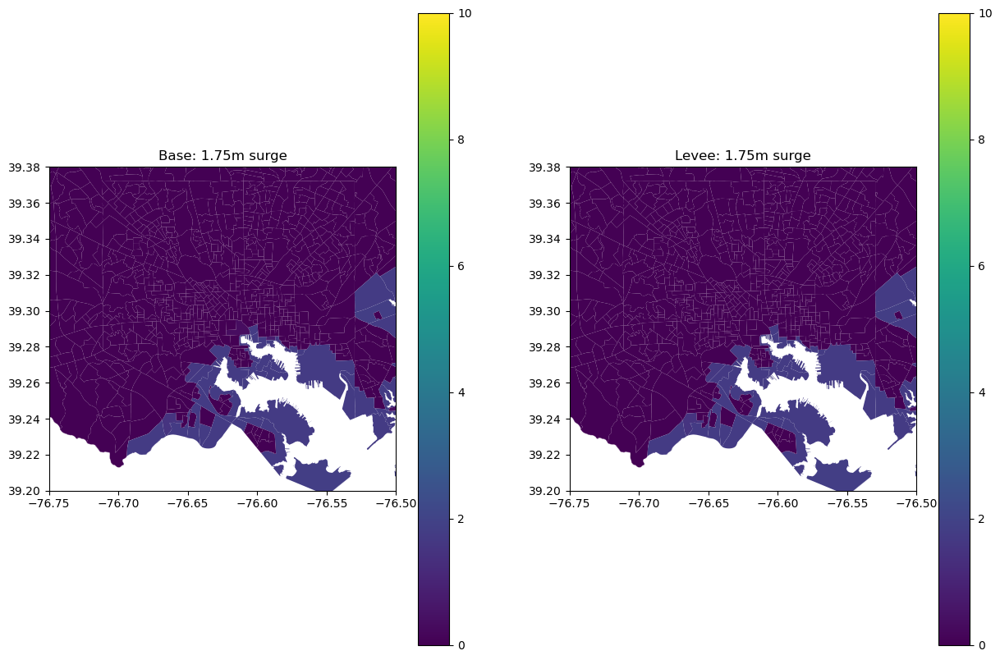

In [15]:
fig, axs = plt.subplots(1,2,figsize = (15,10))

xlim = ([-76.75,  -76.5])
ylim = ([39.2,  39.38])

axs[0].set_xlim(xlim)
axs[0].set_ylim(ylim)

axs[1].set_xlim(xlim)
axs[1].set_ylim(ylim)



base_gdf.plot(column = '1.75',legend=True, vmin = 0, vmax = 10, ax = axs[0])
levee_gdf.plot(column = '1.75',legend=True, vmin = 0, vmax = 10, ax = axs[1])


axs[0].set_title('Base: 1.75m surge')
axs[1].set_title('Levee: 1.75m surge')

plt.show()

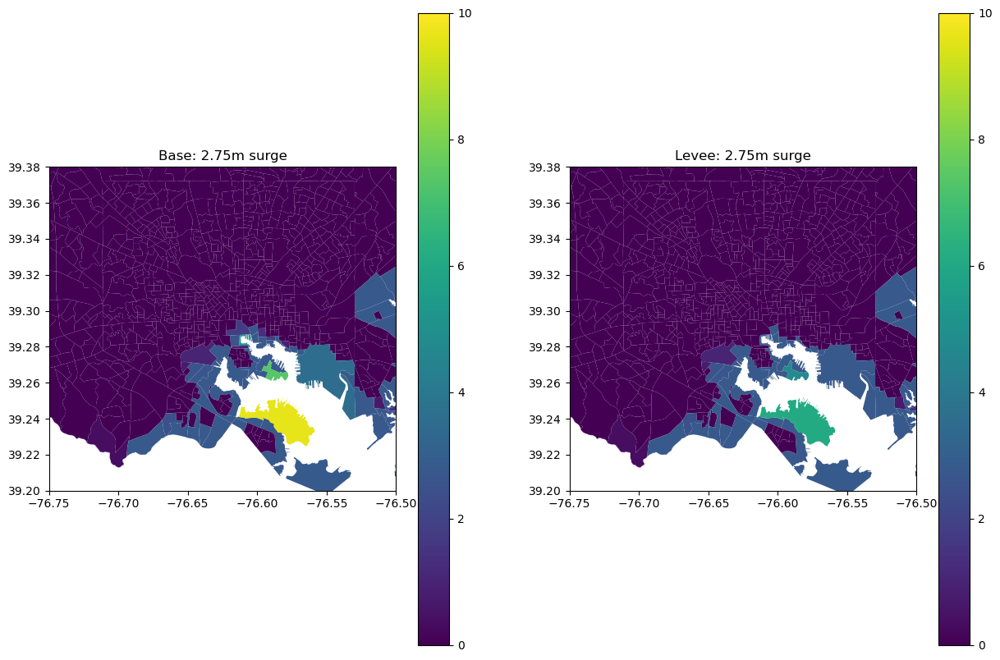

In [19]:
fig, axs = plt.subplots(1,2,figsize = (15,10))

xlim = ([-76.75,  -76.5])
ylim = ([39.2,  39.38])

axs[0].set_xlim(xlim)
axs[0].set_ylim(ylim)

axs[1].set_xlim(xlim)
axs[1].set_ylim(ylim)



base_gdf.plot(column = '2.75',legend=True, vmin = 0, vmax = 10, ax = axs[0])
levee_gdf.plot(column = '2.75',legend=True, vmin = 0, vmax = 10, ax = axs[1])


axs[0].set_title('Base: 2.75m surge')
axs[1].set_title('Levee: 2.75m surge')

plt.show()

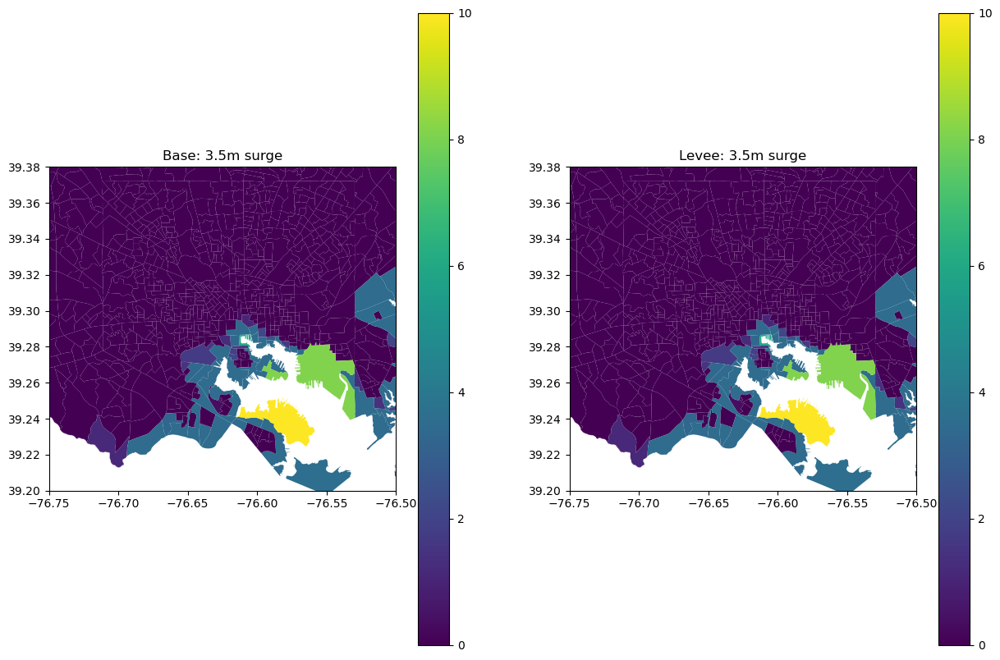

In [32]:
fig, axs = plt.subplots(1,2,figsize = (15,10))

xlim = ([-76.75,  -76.5])
ylim = ([39.2,  39.38])

axs[0].set_xlim(xlim)
axs[0].set_ylim(ylim)

axs[1].set_xlim(xlim)
axs[1].set_ylim(ylim)



base_gdf.plot(column = '3.5',legend=True, vmin = 0, vmax = 10, ax = axs[0])
levee_gdf.plot(column = '3.5',legend=True, vmin = 0, vmax = 10, ax = axs[1])


axs[0].set_title('Base: 3.5m surge')
axs[1].set_title('Levee: 3.5m surge')

plt.show()

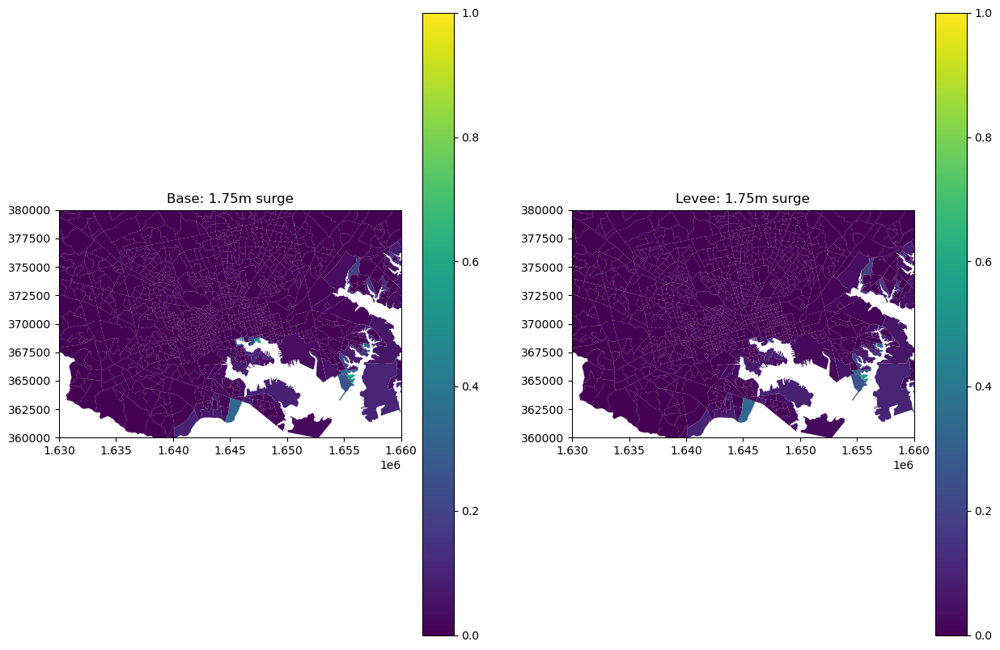

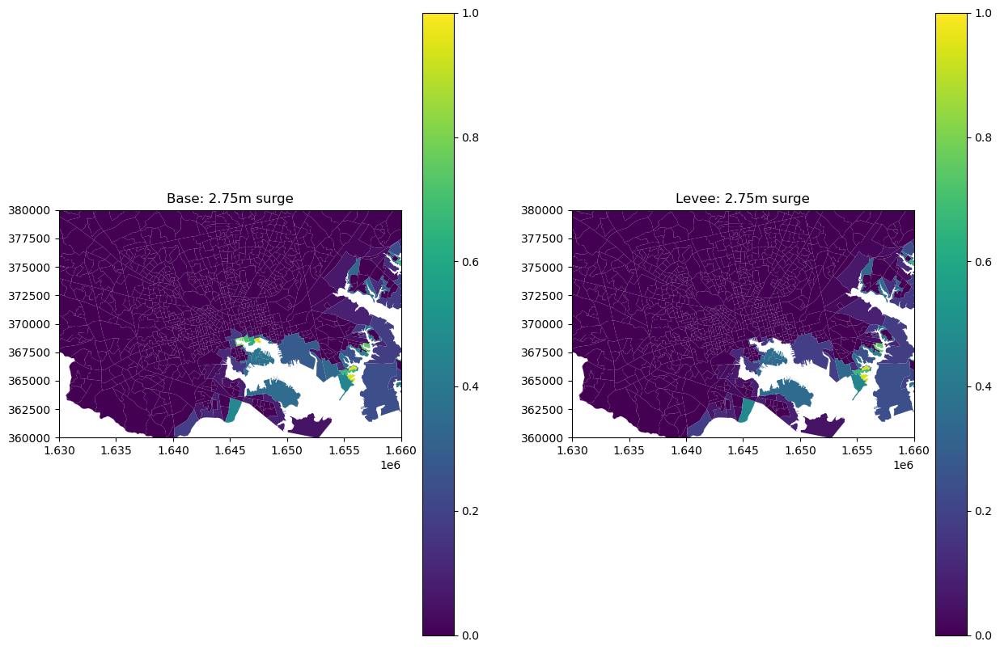

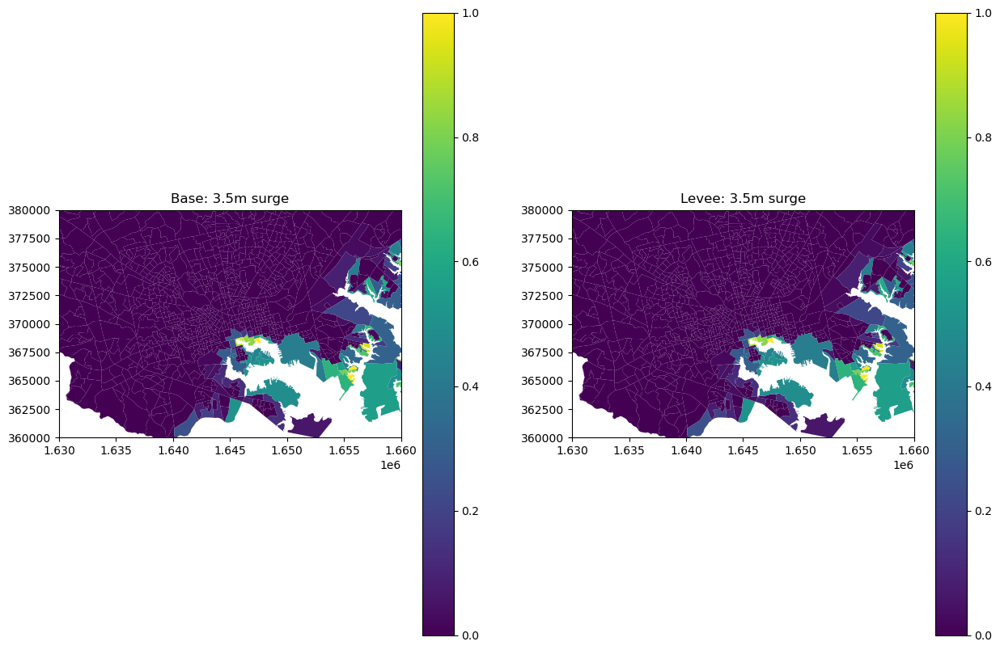